# STEP 1  DATA collections ,Data Preprocessing, DATA cleaning

In [1]:
import tensorflow as tf
from tensorflow.keras import models, layers
import matplotlib.pyplot as plt
from tensorflow.keras.callbacks import EarlyStopping

In [2]:
# create contants
IMAGE_SIZE = 256
BATCH_SIZE = 32
CHANNELS  = 3
EPOCHS = 50 # we are going to run 50 epochs  epoch refers to a complete iteration over the training data. 
# During each epoch, the model is trained on the entire dataset

In [3]:
# here we 
Plant_dataset =tf.keras.preprocessing.image_dataset_from_directory (
    "Plants",
    shuffle = True,
    image_size = (IMAGE_SIZE,IMAGE_SIZE),
    batch_size = BATCH_SIZE
)

Found 5627 files belonging to 6 classes.


In [4]:
# class_names is  our folder where our images are store
class_names = Plant_dataset.class_names
class_names

['Grape___Black_rot',
 'Grape___Esca_(Black_Measles)',
 'Grape___Leaf_blight_(Isariopsis_Leaf_Spot)',
 'Grape___healthy',
 'Strawberry___Leaf_scorch',
 'Strawberry___healthy']

In [5]:
# it show 176 is beacuse every element of dataset is the batch of  32 images 
# it mean PER batch has 176 pitcure or images
len(Plant_dataset)

176

In [7]:
176*32 # total images 5632

5632

In [8]:
#create the function for explore or to understand the conpost 
# here we create the function where we run 1 batch 
for image_batch, label_batch in Plant_dataset.take(1):
    print(image_batch.shape)
    
#In image shape we can see that there are 32 images and there size is 256 256 , and 3 is channel as we
# know gary scale has 1 channel and color scale has 3 channel 


# In bactch numpy we can watch that there are 5 classes or four folder where our images data store
    print(label_batch.numpy())


(32, 256, 256, 3)
[2 5 4 2 5 1 0 2 5 2 3 3 1 5 0 0 3 2 0 0 2 3 1 5 2 2 4 0 1 2 4 4]


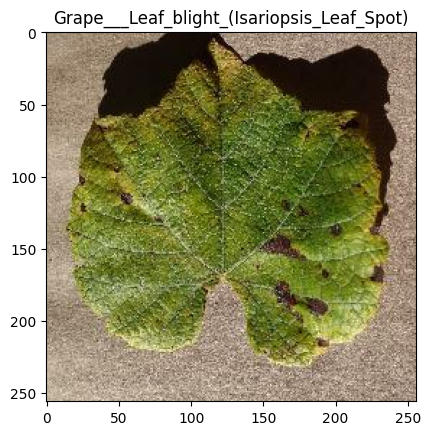

In [9]:
# for vauctation we use plt.imshow

plt.imshow(image_batch[0].numpy().astype("uint8")) # here we convert the float type
plt.title(class_names[label_batch[0]]) # for wactching the name of plant
plt.show() # for hiding the number we also hide through

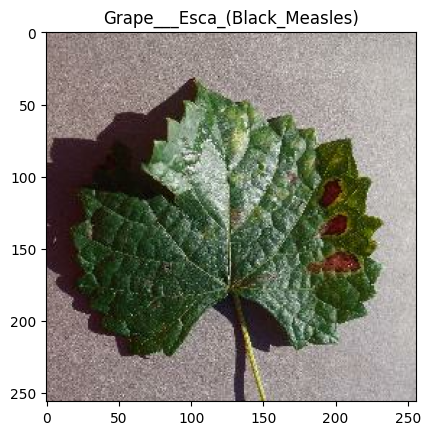

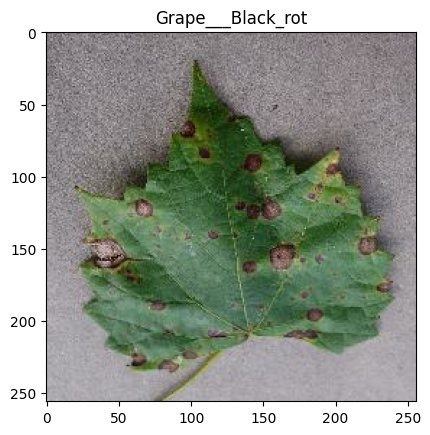

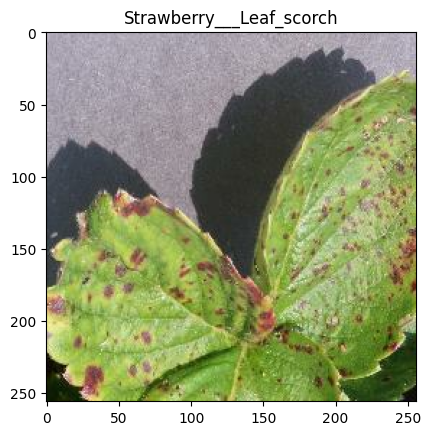

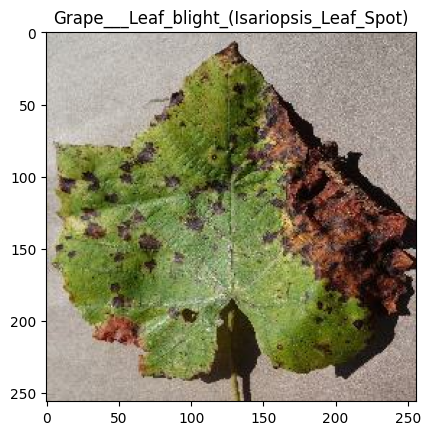

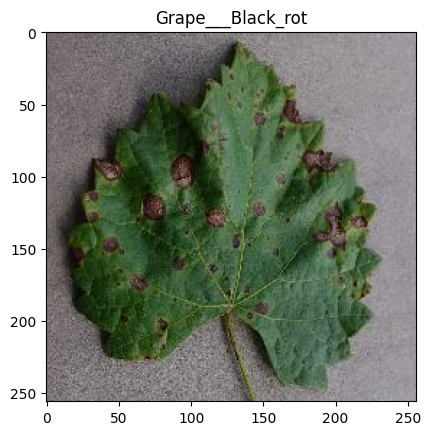

...

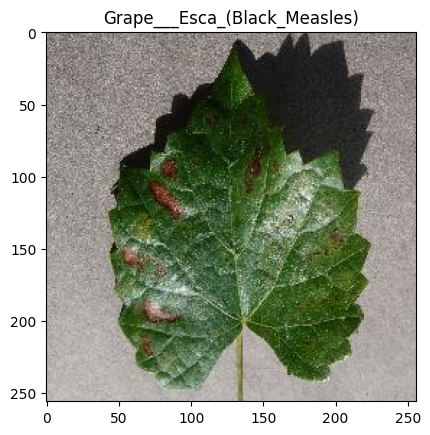

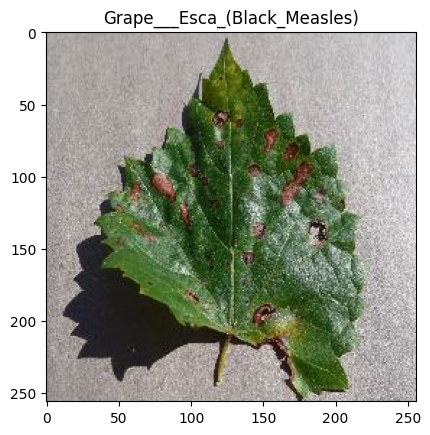

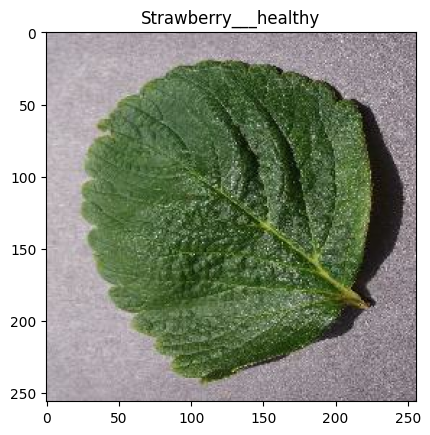

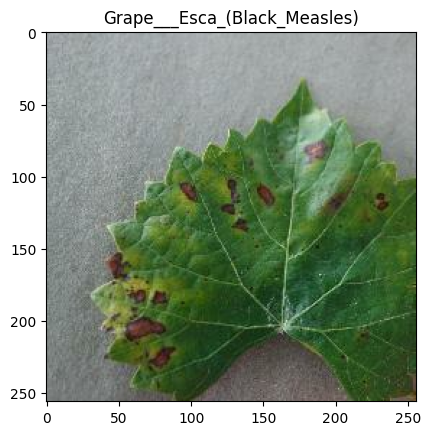

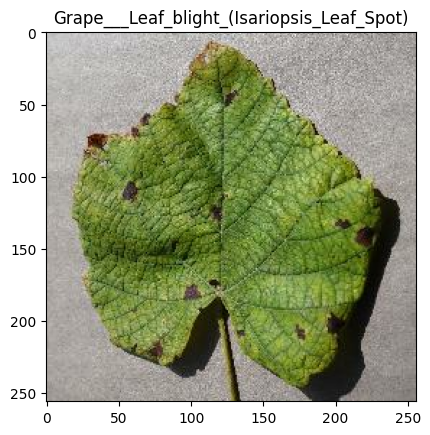

In [10]:
# Now i am going to create a function which show 12 images
# In this funcion the data is little bit massup so i create a subplot for Create and control multiple axes
for image_batch, label_batch in Plant_dataset.take(1):
    for i in range(12):
        plt.imshow(image_batch[i].numpy().astype("uint8")) # here we convert the float type
        plt.title(class_names[label_batch[i]]) # for wactching the name of plant
        plt.show() # for hiding the number we also hide through 
        

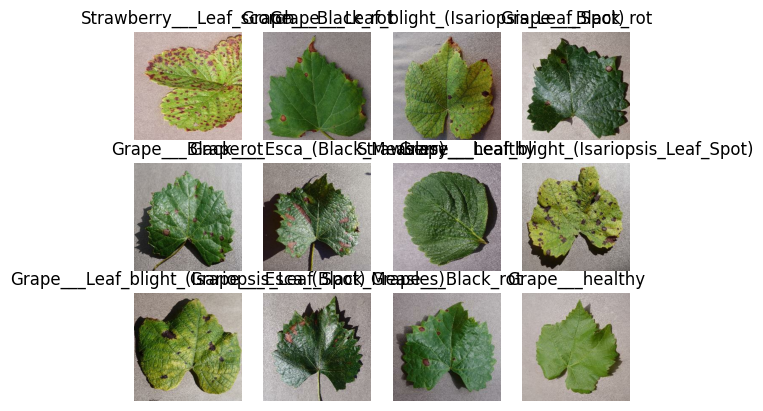

In [11]:
# subplot : Create and control multiple axes

for image_batch, label_batch in Plant_dataset.take(1):
    for i in range(12):
        ax = plt.subplot(3,4,i+1)# here we create subplot and (3,4,i+1) is a matrix
        plt.imshow(image_batch[i].numpy().astype("uint8")) 
        plt.title(class_names[label_batch[i]]) 
        plt.axis('off') # for hiding the number axis
# now we are going to set the images size for batter

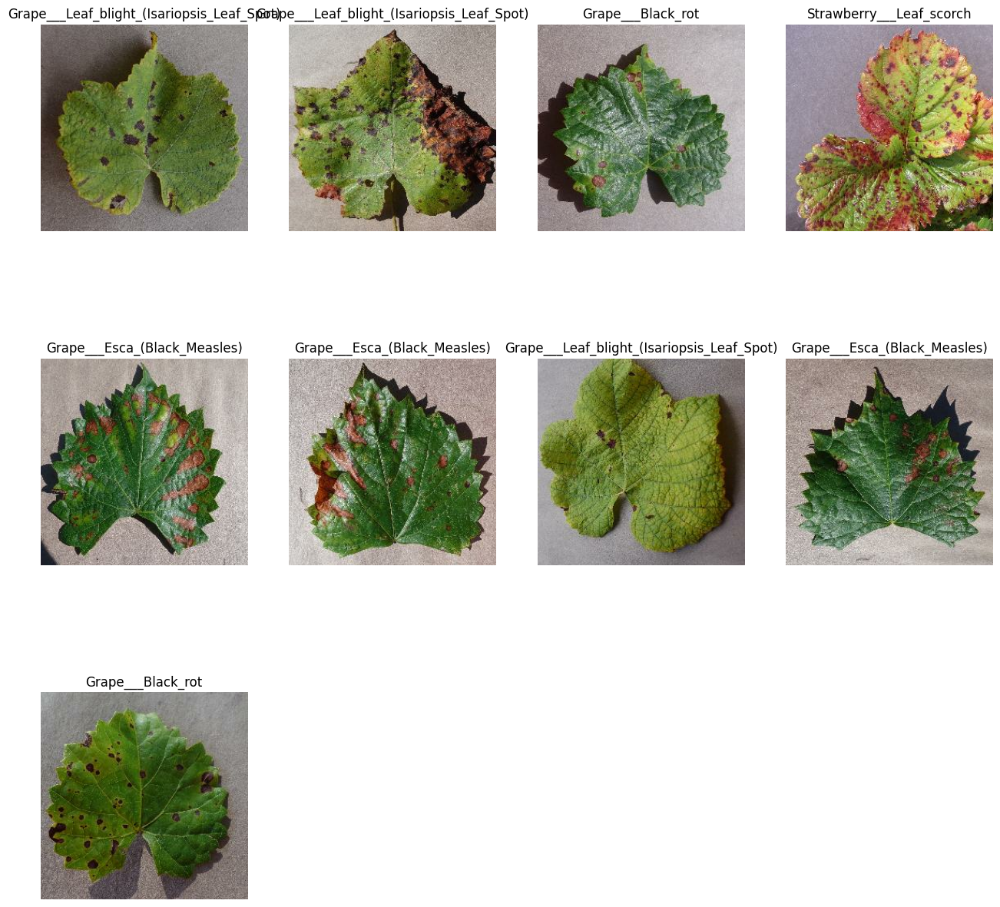

In [12]:
# now we are going to set the images size for batter valuction look this 
plt.figure(figsize = ( 16,16))
for image_batch, label_batch in Plant_dataset.take(1):
    for i in range(9):
        ax = plt.subplot(3,4,i+1)# here we create subplot and (3,4,i+1) is a matrix
        plt.imshow(image_batch[i].numpy().astype("uint8")) 
        plt.title(class_names[label_batch[i]]) 
        plt.axis('off') # for hiding the number


# Note 1 now we are going to training and test and Validation and epocho


# Note 2  in sklearn we have train_test_split method for train and test

In [13]:
# Here we are going to do dataset.take (10) it will take first 10 set or data form dataset
train_size = 0.8
len(Plant_dataset)*train_size


140.8

In [14]:
# what should i do now i take first 96 batch
train_Plant_dataset = Plant_dataset.take(96)
len(train_Plant_dataset)

96

In [15]:
# and now i am going to skip first 96 batch

test_Plant_dataset = Plant_dataset.skip(96)
len(test_Plant_dataset)

80

In [16]:
#now my Validation size 
Validation_size =0.1
# now the 10 % for my actical dataset is 12.100000000000001
len(Plant_dataset)*Validation_size


17.6

In [17]:
# now i am going to take validation dataset 
Validation_size = test_Plant_dataset.take(34)
len(Validation_size)


34

In [18]:
# now i am going to skip first 12 Validation
test_Plant_dataset = test_Plant_dataset.skip(12)
len(test_Plant_dataset)

68

# Note 3 
# we use shuffle beacuse helps break order-based patterns, reduces bias and overfitting, improves generalization capabilities, and enhances the efficiency of the training process.
# tack the tenssfolw dataset and it also do track the split ratio


In [19]:
# Note 3 
# we use shuffle beacuse helps break order-based patterns, reduces bias and overfitting, improves generalization capabilities, and enhances the efficiency of the training process.
# tack the tenssfolw dataset and it also do track the split ratio


In [20]:
# here i take 80 train , 10 test , 10 vali
import tensorflow as tf
# now Getting dataset size
def get_dataset_partition_tf(Plant_dataset, train_split=0.8, validation_split=0.1, test_split=0.1, shuffle=True, shuffle_size=100000):
    dataset_size = sum(1 for _ in Plant_dataset) 
    
# we use shuffle argument  before we train test we shuffle the 
# Shuffle the dataset if required
    if shuffle:
           Plant_dataset = Plant_dataset.shuffle(shuffle_size, seed=12)

       
# tack the tenssfolw dataset and it also do track the split ratio
# Calculate split sizes
    train_size = int(train_split * dataset_size) 
# above train size 
    validation_size = int(validation_split * dataset_size)
# vali size also convert in the 

# Partition the dataset
    train_Plant_dataset = Plant_dataset.take(train_size)
    validation_dataset = Plant_dataset.skip(train_size).take(validation_size)
    test_Plant_dataset = Plant_dataset.skip(train_size + validation_size)

    return train_Plant_dataset, validation_dataset, test_Plant_dataset



In [21]:
train_split ,Validation_split ,test_split = get_dataset_partition_tf(Plant_dataset )
train_Plant_dataset, validation_dataset, test_Plant_dataset = get_dataset_partition_tf(Plant_dataset)

In [22]:
len(train_split)

140

In [23]:
len(Validation_split)

17

In [24]:
len(test_split)

19

# Note 4
## now we are usinig cache( ) pipeline it will read the image from the disk and then for next irtraation when we need the same image
## it will keep in the memory it imporve the perform of our pipeline
## Prefetch mask the long latencies required to fetch data from memory. for READ CPU and TRAIN GPU we safe t

In [25]:
train_Plant_dataset = train_Plant_dataset.cache().shuffle(1000).prefetch(buffer_size = tf.data.AUTOTUNE)
test_Plant_dataset = test_Plant_dataset.cache().shuffle(1000).prefetch(buffer_size = tf.data.AUTOTUNE)
validation_dataset = validation_dataset.cache().shuffle(1000).prefetch(buffer_size = tf.data.AUTOTUNE)

# Note 5

## now we are working on preporessing pipeline
### In images processing we do the first thing is scale so the RPB scale or numpy array we watch in the starting so we have to did the size of image 255 into 
### number so we can get the 0 and 1 the way we can do is using below code or tf.keras.Sequential after that we use preprocssing

In [26]:
# here we contect the size and recaling so if there is any image above 255 it at
resize_and_rescale = tf.keras.Sequential([
    layers.Resizing(IMAGE_SIZE,IMAGE_SIZE),
    layers.Rescaling(2.0/255)
])

In [27]:
data_augmentation = tf.keras.Sequential([
    layers.RandomFlip("horizontal_and_Vertical"),
    layers.RandomRotation(0.2),
])

# STEP 2 now we are going to build converition neruol network(CNN) AND Train that dataset and looking the accuracy 

# CNN algroithem

# Note 1
### In deep learning we alway first define the architecture which is below
### now our model architecture is build now we can watch the summery of our model after that we are going to train the model

In [28]:
# building the model and layers or we can say architecture
# creatin a varable of input shape for images
input_shape =(BATCH_SIZE,IMAGE_SIZE,IMAGE_SIZE,CHANNELS) # these variable we already create in the start we can see on cell 187
# Ensure correct label encoding and number of classes
num_classes = 10  
# Adjust this based on the actual number of classes in your dataset

model = models.Sequential([
    resize_and_rescale,
    data_augmentation,
# now we are going to use convolutional layer applies filters to detect patterns, and pooling layers reduce the spatial dimensions
# relu = rectified linear activation function it is very fast to compute
    layers.Conv2D(32,(3,3),activation = 'relu',input_shape = input_shape),
# now we are going to pooling layer 
    layers.MaxPooling2D((2,2)),

# again run the same process for 
    layers.Conv2D(64,(3,3),activation = 'relu'),
    layers.MaxPooling2D((2,2)),

    layers.Conv2D(64,(3,3),activation = 'relu'),
    layers.MaxPooling2D((2,2)),
    
    layers.Conv2D(64,(3,3),activation = 'relu'),
    layers.MaxPooling2D((2,2)),
    
    layers.Conv2D(64,(3,3),activation = 'relu'),
    layers.MaxPooling2D((2,2)),

    layers.Conv2D(64,(3,3),activation = 'relu'),
    layers.MaxPooling2D((2,2)),

# flatten layer
    layers.Flatten(),
    layers.Dense(64 , activation = 'relu'),
    layers.Dense(num_classes , activation = 'softmax'), 
# softmax is used for normalize the probability of classes
    
    
])
model.build(input_shape =input_shape)

C:\Users\samiwadho\myenv\Lib\site-packages\keras\src\layers\convolutional\base_conv.py:107: UserWarning: Do not pass an `input_shape`/`input_dim` argument to a layer. When using Sequential models, prefer using an `Input(shape)` object as the first layer in the model instead.
  super().__init__(activity_regularizer=activity_regularizer, **kwargs)


In [29]:
model.summary() # suummay for our architecture model

Model: "sequential_2"

┏━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━━━┓
┃ Layer (type)                         ┃ Output Shape                ┃         Param # ┃
┡━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━━━┩
│ sequential (Sequential)              │ (32, 256, 256, 3)           │               0 │
├──────────────────────────────────────┼─────────────────────────────┼─────────────────┤
│ sequential_1 (Sequential)            │ (32, 256, 256, 3)           │               0 │
├──────────────────────────────────────┼─────────────────────────────┼─────────────────┤
│ conv2d (Conv2D)                      │ (32, 254, 254, 32)          │             896 │
├──────────────────────────────────────┼─────────────────────────────┼─────────────────┤
│ max_pooling2d (MaxPooling2D)         │ (32, 127, 127, 32)          │               0 │
├──────────────────────────────────────┼─────────────────────────────┼─────────────────┤
│ conv2d_1 (Conv2D)                    │ (32, 125, 125, 64)          │          18,496 │
├──────────────────────────────────────┼─────────────────────────────┼─────────────────┤
│ max_pooling2d_1 (MaxPooling2D)       │ (32, 62, 62, 64)            │               0 │
├──────────────────────────────────────┼─────────────────────────────┼─────────────────┤
│ conv2d_2 (Conv2D)                    │ (32, 60, 60, 64)            │          36,928 │
├──────────────────────────────────────┼─────────────────────────────┼─────────────────┤
│ max_pooling2d_2 (MaxPooling2D)       │ (32, 30, 30, 64)            │               0 │
├──────────────────────────────────────┼─────────────────────────────┼─────────────────┤
│ conv2d_3 (Conv2D)                    │ (32, 28, 28, 64)            │          36,928 │
├──────────────────────────────────────┼─────────────────────────────┼─────────────────┤
│ max_pooling2d_3 (MaxPooling2D)       │ (32, 14, 14, 64)            │               0 │
├──────────────────────────────────────┼─────────────────────────────┼─────────────────┤
│ conv2d_4 (Conv2D)                    │ (32, 12, 12, 64)            │          36,928 │
├──────────────────────────────────────┼─────────────────────────────┼─────────────────┤
│ max_pooling2d_4 (MaxPooling2D)       │ (32, 6, 6, 64)              │               0 │
├──────────────────────────────────────┼─────────────────────────────┼─────────────────┤
│ conv2d_5 (Conv2D)                    │ (32, 4, 4, 64)              │          36,928 │
├──────────────────────────────────────┼─────────────────────────────┼─────────────────┤
│ max_pooling2d_5 (MaxPooling2D)       │ (32, 2, 2, 64)              │               0 │
├──────────────────────────────────────┼─────────────────────────────┼─────────────────┤
│ flatten (Flatten)                    │ (32, 256)                   │               0 │
├──────────────────────────────────────┼─────────────────────────────┼─────────────────┤
│ dense (Dense)                        │ (32, 64)                    │          16,448 │
├──────────────────────────────────────┼─────────────────────────────┼─────────────────┤
│ dense_1 (Dense)                      │ (32, 10)                    │             650 │
└──────────────────────────────────────┴─────────────────────────────┴─────────────────┘

 Total params: 184,202 (719.54 KB)

 Trainable params: 184,202 (719.54 KB)

 Non-trainable params: 0 (0.00 B)

# Note 2
### we compile and optimize our model


In [30]:
model.compile(
    optimizer='adam', loss=tf.keras.losses.SparseCategoricalCrossentropy(from_logits=False), 
    metrics=['accuracy'] )

# Note 3 
### now i am using earlystopping implement early stopping in Keras using the EarlyStopping callback. This callback monitors a specified validation metric and stops training if the metric stops improving for a certain number of epochs. Here's how you can use it in your code:

In [ ]:
from tensorflow.keras.callbacks import EarlyStopping

# Define early stopping callback
early_stopping = EarlyStopping(
    monitor='val_loss',  # Metric to monitor (e.g., validation loss)
    patience=5,          # Number of epochs with no improvement after which training will be stopped
    restore_best_weights=True  # Restore model weights to the best observed during training
)

# Train the model with early stopping
history = model.fit(
    train_Plant_dataset,
    epochs=EPOCHS,
    verbose=1,
    validation_data=validation_dataset,
    callbacks=[early_stopping]  # Pass the early stopping callback
)


Epoch 1/50
140/140 ━━━━━━━━━━━━━━━━━━━━ 184s 1s/step - accuracy: 0.2765 - loss: 1.7062 - val_accuracy: 0.6364 - val_loss: 0.8601
Epoch 2/50
140/140 ━━━━━━━━━━━━━━━━━━━━ 149s 1s/step - accuracy: 0.7269 - loss: 0.7018 - val_accuracy: 0.9072 - val_loss: 0.2603
Epoch 3/50
140/140 ━━━━━━━━━━━━━━━━━━━━ 110s 785ms/step - accuracy: 0.8710 - loss: 0.3319 - val_accuracy: 0.8794 - val_loss: 0.2985
Epoch 4/50
140/140 ━━━━━━━━━━━━━━━━━━━━ 119s 851ms/step - accuracy: 0.9015 - loss: 0.2564 - val_accuracy: 0.9258 - val_loss: 0.2122
Epoch 5/50
140/140 ━━━━━━━━━━━━━━━━━━━━ 101s 722ms/step - accuracy: 0.9375 - loss: 0.1882 - val_accuracy: 0.9184 - val_loss: 0.2408
Epoch 6/50
140/140 ━━━━━━━━━━━━━━━━━━━━ 87s 625ms/step - accuracy: 0.9544 - loss: 0.1286 - val_accuracy: 0.9647 - val_loss: 0.0878
Epoch 7/50
140/140 ━━━━━━━━━━━━━━━━━━━━ 88s 627ms/step - accuracy: 0.9406 - loss: 0.1710 - val_accuracy: 0.9777 - val_loss: 0.0883
Epoch 8/50
140/140 ━━━━━━━━━━━━━━━━━━━━ 89s 636ms/step - accuracy: 0.9707 - loss: 0.

In [73]:
score = model.evaluate(test_Plant_dataset)
score # 98 perstange 

19/19 ━━━━━━━━━━━━━━━━━━━━ 4s 183ms/step - accuracy: 0.9767 - loss: 0.0534


[0.06512180715799332, 0.96875]

In [74]:
history.params

{'verbose': 1, 'epochs': 50, 'steps': 140}

In [75]:
history.history.keys()

dict_keys(['accuracy', 'loss', 'val_accuracy', 'val_loss'])

In [76]:
history.history['accuracy']

[0.9474860429763794,
 0.9544134140014648,
 0.9653631448745728,
 0.9640223383903503,
 0.9584357738494873,
 0.9743016958236694,
 0.9794413447380066,
 0.9796648025512695,
 0.9682681560516357,
 0.9810056090354919,
 0.9767597913742065,
 0.972960889339447,
 0.9796648025512695]

# note 3 now above all the code store in na variable so i can call it eaily 

In [77]:
# now I am going to finding accuracy and validation accuracy of increase
acc = history.history.get('accuracy', [])
val_acc = history.history.get('val_accuracy', [])

#  now I am going to finding of loss and validation loss
loss = history.history.get('loss', [])
val_loss = history.history.get('val_loss', [])


# note 4  now i am going to use ploting  for  valuization 


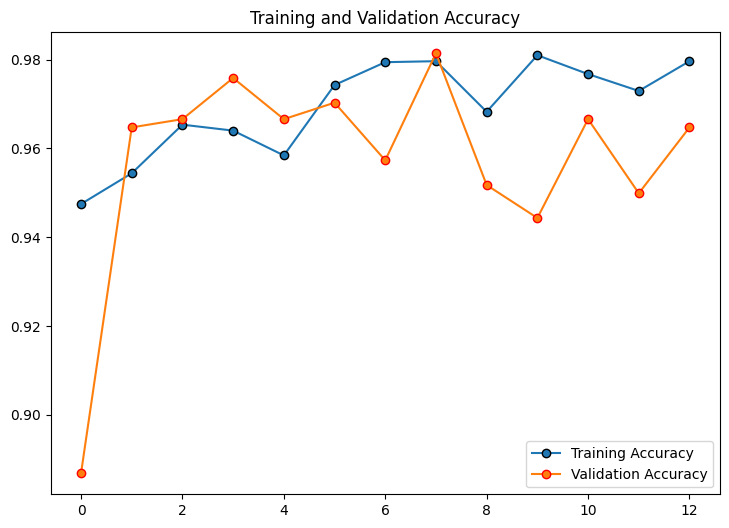

In [78]:
# Plotting training and validation accuracy


# Determine the number of epochs actually run
epochs_range = range(len(acc))

# Plot accuracy
plt.figure(figsize=(19,6))
plt.subplot(1, 2, 1)
plt.plot(epochs_range, acc, label='Training Accuracy', marker = 'o',markeredgecolor = 'black')
plt.plot(epochs_range, val_acc, label='Validation Accuracy', marker = 'o',markeredgecolor = 'red')
plt.legend(loc='lower right')
plt.title('Training and Validation Accuracy')
plt.show()




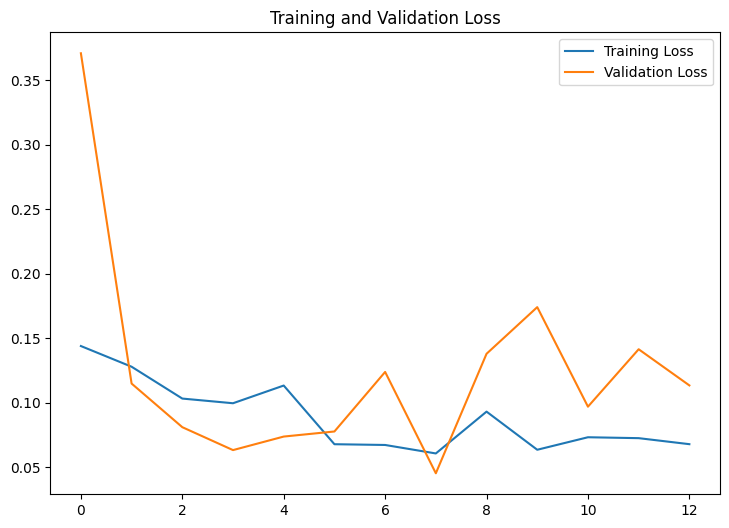

In [79]:
# Plot loss
plt.figure(figsize=(19,6))
plt.subplot(1, 2, 2)
plt.plot(epochs_range, loss, label='Training Loss')
plt.plot(epochs_range, val_loss, label='Validation Loss')
plt.legend(loc='upper right')
plt.title('Training and Validation Loss')
plt.show()

In [80]:
# i am going to predicattion on the dataset
for images_batch , labels_batch in test_Plant_dataset.take(1):
    print(images_batch[0].numpy())  # for display numpy array we write like this
    

[[[129. 124. 121.]
  [114. 109. 106.]
  [126. 121. 118.]
  ...
  [222. 217. 213.]
  [167. 162. 158.]
  [193. 188. 184.]]

 [[132. 127. 124.]
  [112. 107. 104.]
  [143. 138. 135.]
  ...
  [167. 162. 158.]
  [178. 173. 169.]
  [200. 195. 191.]]

 [[123. 118. 115.]
  [128. 123. 120.]
  [134. 129. 126.]
  ...
  [178. 173. 169.]
  [189. 184. 180.]
  [203. 198. 194.]]

 ...

 [[108. 103. 100.]
  [128. 123. 120.]
  [130. 125. 122.]
  ...
  [153. 145. 142.]
  [191. 183. 180.]
  [163. 155. 152.]]

 [[138. 133. 130.]
  [115. 110. 107.]
  [131. 126. 123.]
  ...
  [164. 156. 153.]
  [131. 123. 120.]
  [149. 141. 138.]]

 [[140. 135. 132.]
  [ 97.  92.  89.]
  [112. 107. 104.]
  ...
  [143. 135. 132.]
  [135. 127. 124.]
  [164. 156. 153.]]]


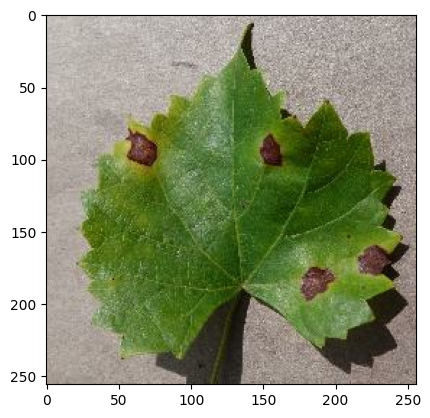

In [81]:
for images_batch , labels_batch in test_Plant_dataset.take(1):
        plt.imshow(images_batch[0].numpy().astype('uint8')) # for display images we write this code


first images to predict
First image's actual label :  Grape___Leaf_blight_(Isariopsis_Leaf_Spot)
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 379ms/step
Predict label :  Grape___Leaf_blight_(Isariopsis_Leaf_Spot)


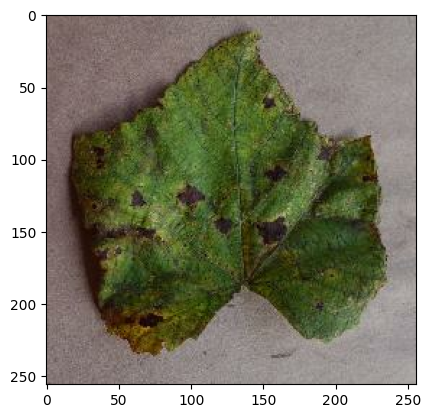

In [82]:
import numpy as np
for images_batch , labels_batch in test_Plant_dataset.take(1):
    first_image = images_batch[0].numpy().astype('uint8')
    first_label =labels_batch[0].numpy() 
    
    print("first images to predict")
    plt.imshow(first_image)
    print("First image's actual label : ", class_names[first_label])

    # now what is my predict image model name here we can see the original value label and predict value label 
    # they are same or not
    batch_predication = model.predict(images_batch)
    print("Predict label : ",class_names[np.argmax(batch_predication[0])])


# note 5 
### now i am going to write the function  where take images and model as input and predict the class and confidnace/ accuracy

In [83]:
# here i put the name of batch of images and labels from my plant dataset

for image_batch, label_batch in Plant_dataset.take(1):
    images = image_batch
    labels = label_batch.numpy()
    class_names = ['Grape___Black_rot',
 'Grape___Esca_(Black_Measles)',
 'Grape___Leaf_blight_(Isariopsis_Leaf_Spot)',
 'Grape___healthy',
 'Strawberry___Leaf_scorch',
 'Strawberry___healthy']  

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 52ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 32ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 40ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 21ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 26ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 35ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 26ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 23ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 33ms/step


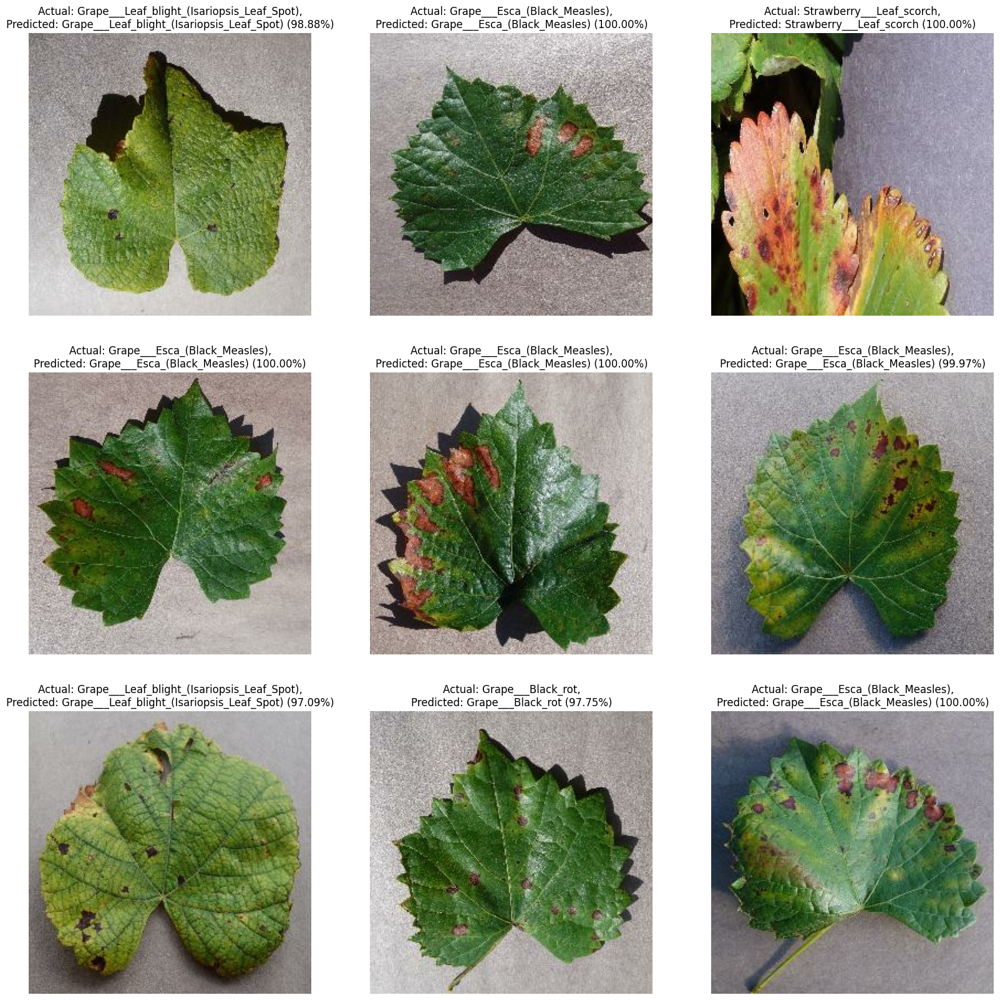

In [104]:
  # Correcting the module name to 'image' instead of 'images'
def predict(model, img):
    img_array = tf.keras.preprocessing.image.img_to_array(img.numpy())
    img_array = tf.expand_dims(img_array, 0)  # Create a batch
    prediction = model.predict(img_array)
    
    predicted_class = np.argmax(prediction[0])
    confidence = round(100 * np.max(prediction[0]), 2)
    return predicted_class, confidence

# Assuming 'images' and 'labels' are your data and 'class_names' is the list of class names
plt.figure(figsize=(20, 20))
for i in range(9):
    ax = plt.subplot(3, 3, i + 1)
    plt.imshow(images[i].numpy().astype("uint8"))
    
    predicted_class, confidence = predict(model, images[i])
    actual_class = class_names[labels[i]]
    
    plt.title(f"Actual: {actual_class},\nPredicted: {class_names[predicted_class]} ({confidence:.2f}%)")
    plt.axis("off")
plt.show()


In [117]:

import os

model_version = 4
save_dir = r"D:\A_WORK_DATA\Corn disease Project\saved models\5"
os.makedirs(save_dir, exist_ok=True)
model_path = os.path.join(save_dir, f"{model_version}.keras")
try:
    model.save(model_path)
    print(f"Model saved to: {model_path}")
except ValueError as e:
    print(f"Error saving model: {e}")



TypeError: cannot pickle 'module' object

In [119]:
from tensorflow.keras.models import load_model

ew_model = tf.keras.models.load_model('D:\A_WORK_DATA\Corn disease Project\saved models\5')

# Check its architecture
new_model.summary(ew_model)

#Save the model into h5 format
new_model.save('New_Model1.h5')

ValueError: File format not supported: filepath=D:\A_WORK_DATA\Corn disease Project\saved models. Keras 3 only supports V3 `.keras` files and legacy H5 format files (`.h5` extension). Note that the legacy SavedModel format is not supported by `load_model()` in Keras 3. In order to reload a TensorFlow SavedModel as an inference-only layer in Keras 3, use `keras.layers.TFSMLayer(D:\A_WORK_DATA\Corn disease Project\saved models, call_endpoint='serving_default')` (note that your `call_endpoint` might have a different name).

In [98]:
import cv2 
test_img = cv2.imread(r'C:\Users\samiwadho\Downloads\images.jpg')

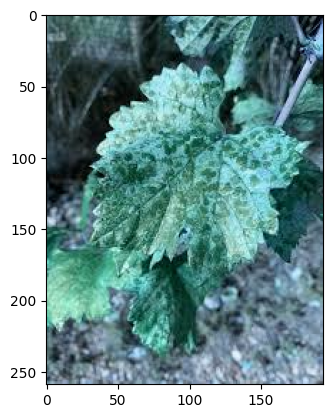

In [99]:
plt.imshow(test_img)

In [95]:

test_img.shape

(259, 194, 3)

In [ ]:
test_input = test_img.reshape((1,256,256,3))

In [90]:
model.predict(test_input)

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 127ms/step


array([[1.9230332e-02, 4.7178976e-03, 5.7751242e-02, 8.2500851e-01,
        8.4728192e-05, 9.3196042e-02, 5.9628420e-08, 2.8030320e-06,
        2.2777367e-06, 6.0402294e-06]], dtype=float32)

In [94]:
import numpy as np

# Example prediction array
predictions = np.array([[1.9230332e-02, 4.7178976e-03, 5.7751242e-02, 8.2500851e-01,
        8.4728192e-05, 9.3196042e-02, 5.9628420e-08, 2.8030320e-06,
        2.2777367e-06, 6.0402294e-06]], dtype=np.float32)
# Get the predicted class index
predicted_class = np.argmax(predictions[0])
# Get the confidence of the predicted class
confidence = np.max(predictions[0]) * 100

predicted_class, confidence



(3, 82.50085115432739)